## Import

In [1]:
from Utils.EDA import *
from Utils.Data_Preprocessing import *
from Utils.Models import *
from Utils.Evaluation import *
from Utils.plot_prediction import *

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Data Preprocessing

In [2]:
df = load_data('Data/Tasla_Stock_Updated_V2.csv')

In [3]:
df_train, df_test = split_data(df)

# Assuming df_train and df_test are the resulting dataframes from split_data(df)
df_train.to_csv('Data/df_train.csv', index=False)  # Save train dataframe to CSV
df_test.to_csv('Data/df_test.csv', index=False)    # Save test dataframe to CSV

print("Dataframes saved to 'df_train.csv' and 'df_test.csv'")

Dataframes saved to 'df_train.csv' and 'df_test.csv'


In [4]:
df_train=create_features(df_train)
df_test=create_features(df_test)



In [5]:
df_full = create_features(df)


Original dataset shape: (1799, 14)
Augmented dataset shape: (2799, 14)


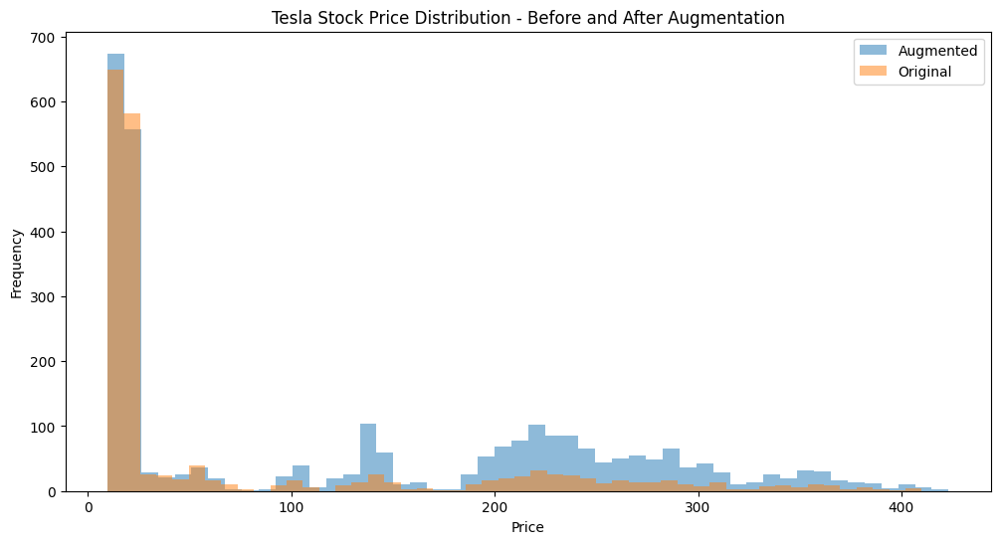

Original - Number of samples with price >= 100: 416
Augmented - Number of samples with price >= 100: 1412


In [6]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
from datetime import timedelta

# Assuming df_full is your complete dataset with Tesla stock prices

# Define a threshold for high-price samples
threshold = 100  # Adjust based on your specific needs

# Function to augment data with time shifts
def augment_with_time_shift(df, num_samples=100, max_days_shift=10):
    """Create augmented samples by shifting dates slightly"""
    augmented_samples = []
    
    # Get high price samples
    high_price_df = df[df['Close'] >= threshold]
    
    # If there are no high price samples, return empty DataFrame
    if len(high_price_df) == 0:
        print("No high price samples found to augment")
        return pd.DataFrame(columns=df.columns)
    
    # Sample with replacement to create new samples
    for _ in range(num_samples):
        # Randomly select a high price sample
        sample = high_price_df.sample(1).iloc[0].copy()
        
        # Add a small random date shift (if date column exists)
        if 'Date' in df.columns:
            date_shift = random.randint(-max_days_shift, max_days_shift)
            if pd.api.types.is_datetime64_any_dtype(sample['Date']):
                # If date is already datetime
                sample['Date'] = sample['Date'] + timedelta(days=date_shift)
            elif isinstance(sample['Date'], str):
                # If date is stored as string, convert to datetime first
                sample['Date'] = pd.to_datetime(sample['Date']) + timedelta(days=date_shift)
        
        augmented_samples.append(sample)
    
    return pd.DataFrame(augmented_samples)

# Similarly for the price variation function
def augment_with_price_variation(df, num_samples=100, variation_pct=0.05):
    """Create augmented samples by adding noise to price values"""
    augmented_samples = []
    
    # Get high price samples
    high_price_df = df[df['Close'] >= threshold]
    
    # If there are no high price samples, return empty DataFrame
    if len(high_price_df) == 0:
        print("No high price samples found to augment")
        return pd.DataFrame(columns=df.columns)
    
    price_columns = ['Open', 'High', 'Low', 'Close']
    # Adjust the list above based on your actual column names
    
    # Sample with replacement to create new samples
    for _ in range(num_samples):
        # Randomly select a high price sample
        sample = high_price_df.sample(1).iloc[0].copy()
        
        # Add random noise to price columns
        for col in price_columns:
            if col in df.columns:
                # Add up to ±variation_pct% noise
                noise_factor = 1 + random.uniform(-variation_pct, variation_pct)
                sample[col] = sample[col] * noise_factor
        
        augmented_samples.append(sample)
    
    return pd.DataFrame(augmented_samples)

# Number of samples to augment (adjust as needed)
num_augmented_samples = 500  # Increase this if needed

# Generate augmented samples
augmented_df1 = augment_with_time_shift(df_train, num_samples=num_augmented_samples)
augmented_df2 = augment_with_price_variation(df_train, num_samples=num_augmented_samples)

# Combine augmented samples with original dataset
df_augmented = pd.concat([df_train, augmented_df1, augmented_df2], ignore_index=True)

# Sort by date if available
if 'Date' in df_augmented.columns:
    df_augmented = df_augmented.sort_values('Date')

print("Original dataset shape:", df_train.shape)
print("Augmented dataset shape:", df_augmented.shape)

# Visualize the price distribution after augmentation
plt.figure(figsize=(12, 6))
plt.hist(df_augmented['Close'], bins=50, alpha=0.5, label='Augmented')
plt.hist(df_train['Close'], bins=50, alpha=0.5, label='Original')
plt.title('Tesla Stock Price Distribution - Before and After Augmentation')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# Verify that we've added more high-value samples
print(f"Original - Number of samples with price >= {threshold}: {len(df_train[df_train['Close'] >= threshold])}")
print(f"Augmented - Number of samples with price >= {threshold}: {len(df_augmented[df_augmented['Close'] >= threshold])}")

In [7]:
df_test.columns

Index(['Unnamed: 0', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Monthly_Return', 'MA5', 'MA10', 'MA20', 'Volatility_5',
       'Volatility_10', 'Volatility_20', 'Target'],
      dtype='object')

In [8]:
features_to_scale = ['Open', 'High', 'Low', 'Close', 'Volume']
target_to_scale = ['Target']
df_train_scaled, df_test_scaled, fitted_scalerX,fitted_scalerY = scale_features(df_train, df_test, features_to_scale,target_to_scale)
print("example of scaled data")
print(df_test_scaled.columns)    

example of scaled data
Index(['Unnamed: 0', 'Open', 'High', 'Low', 'Close', 'Volume',
       'Monthly_Return', 'MA5', 'MA10', 'MA20', 'Volatility_5',
       'Volatility_10', 'Volatility_20', 'Target'],
      dtype='object')


# EDA

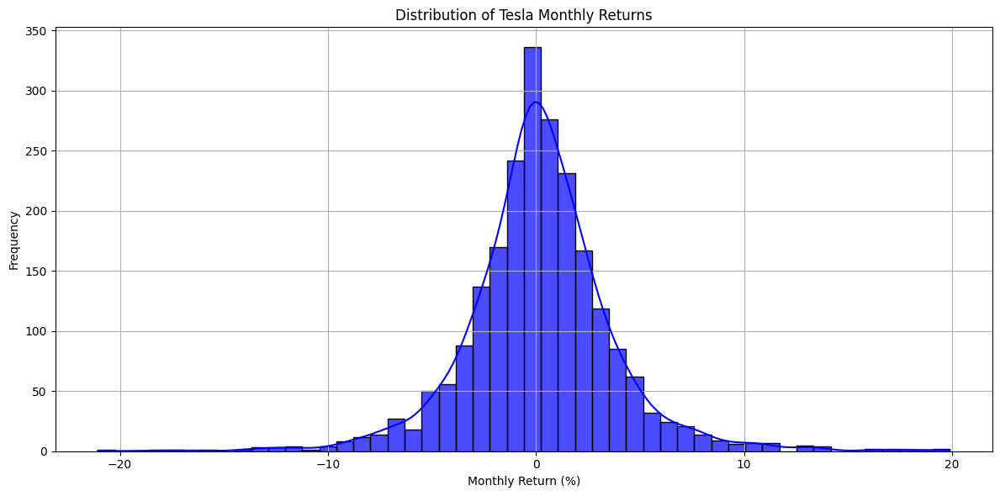

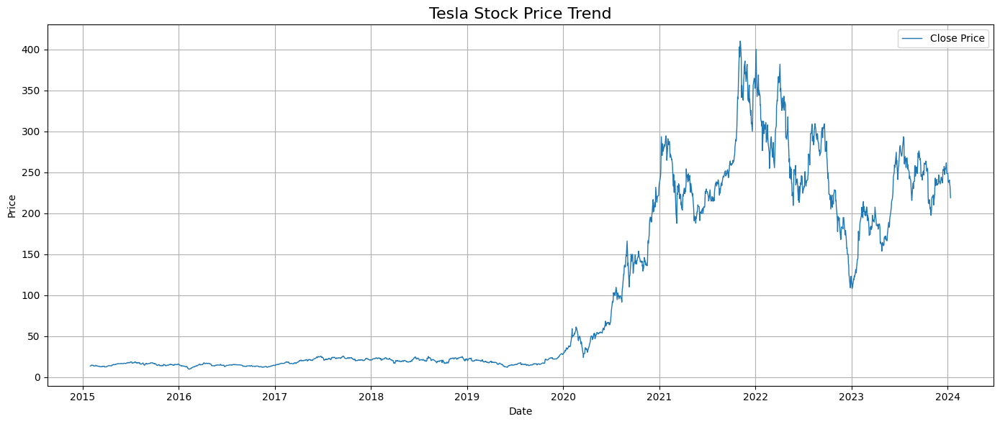

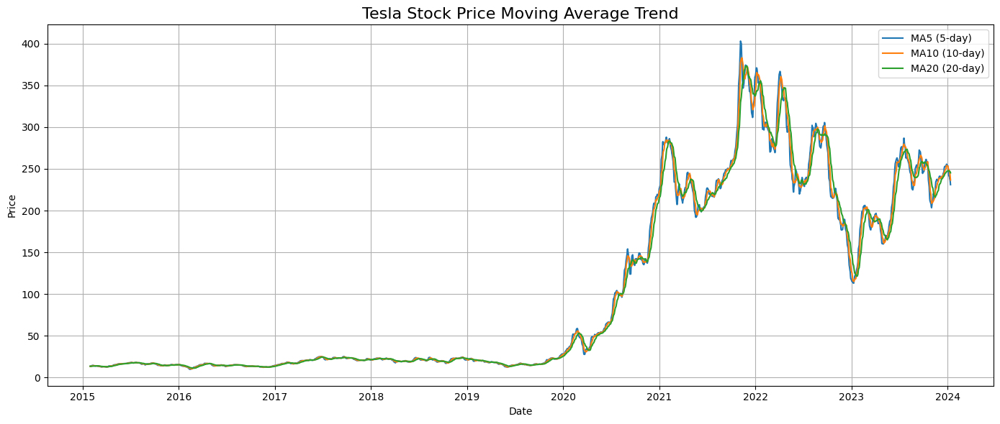

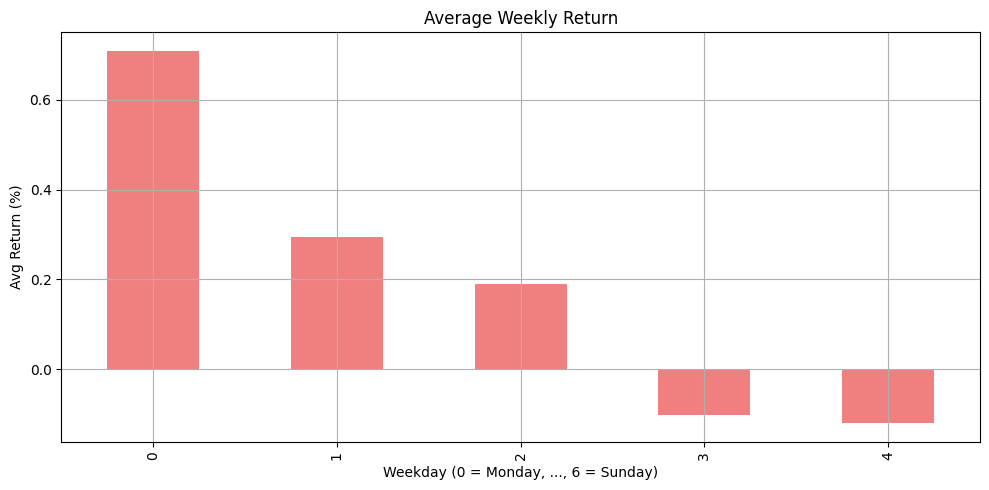

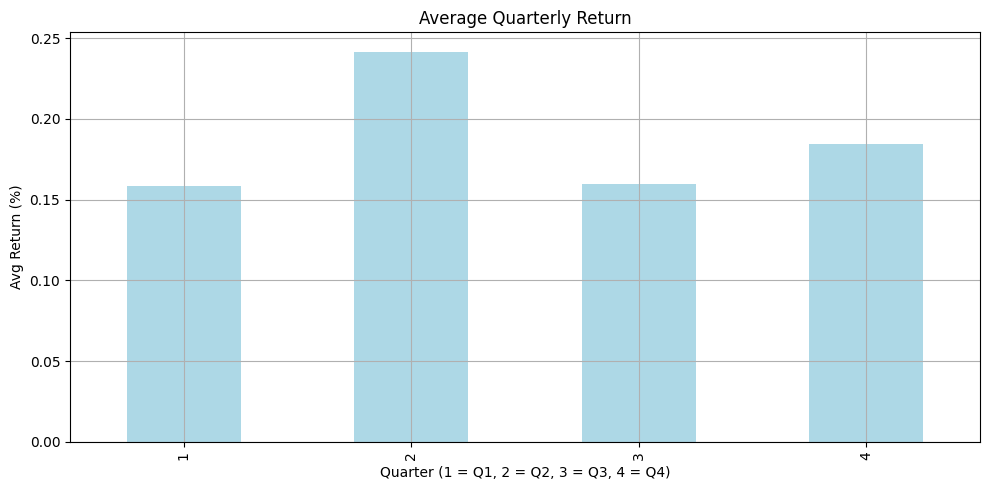

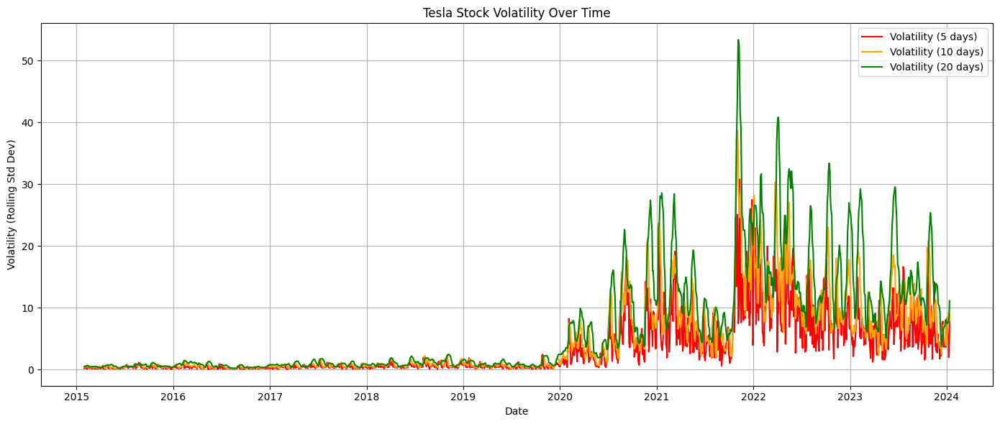

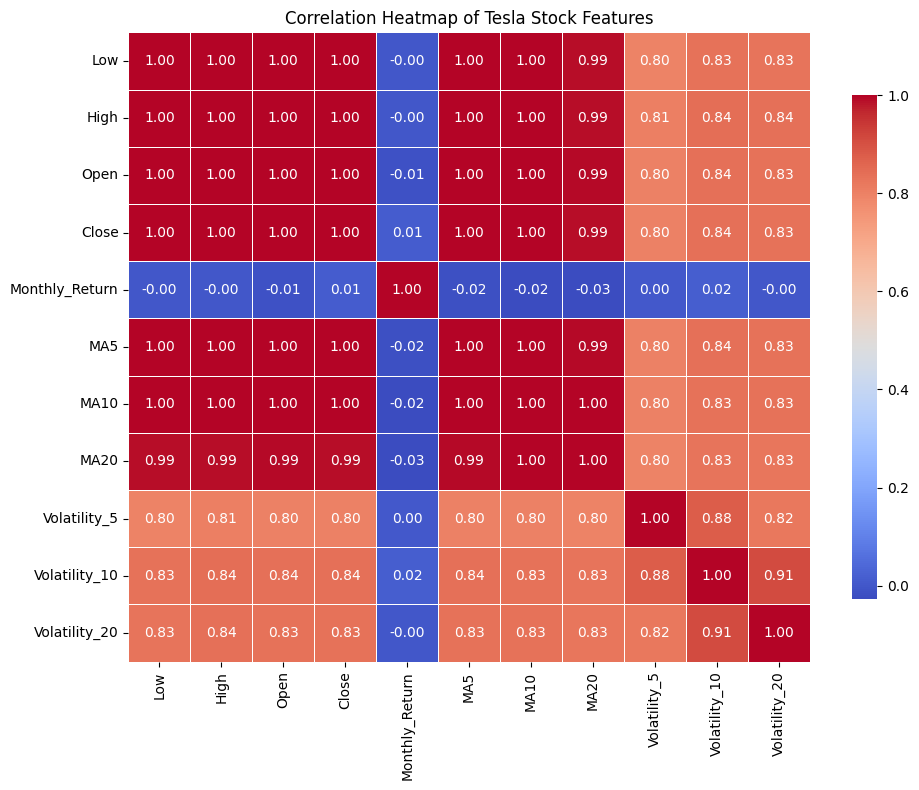

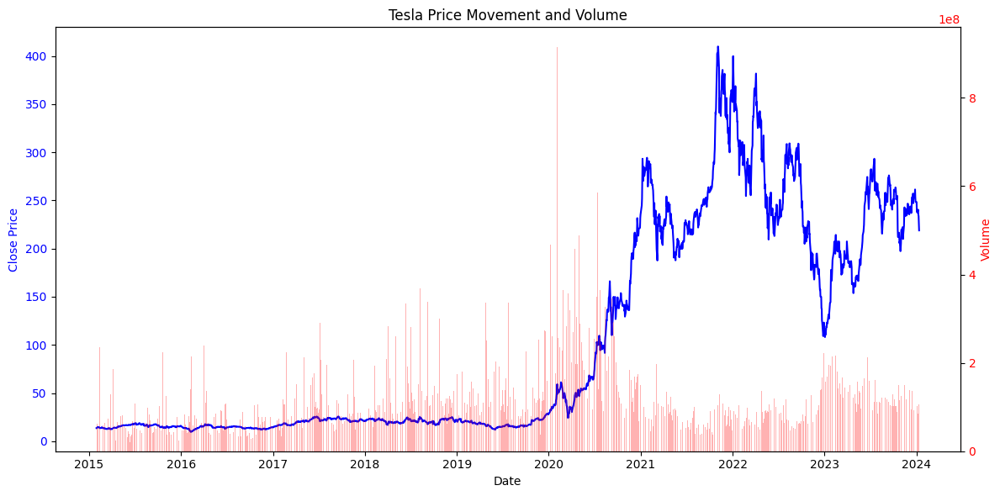

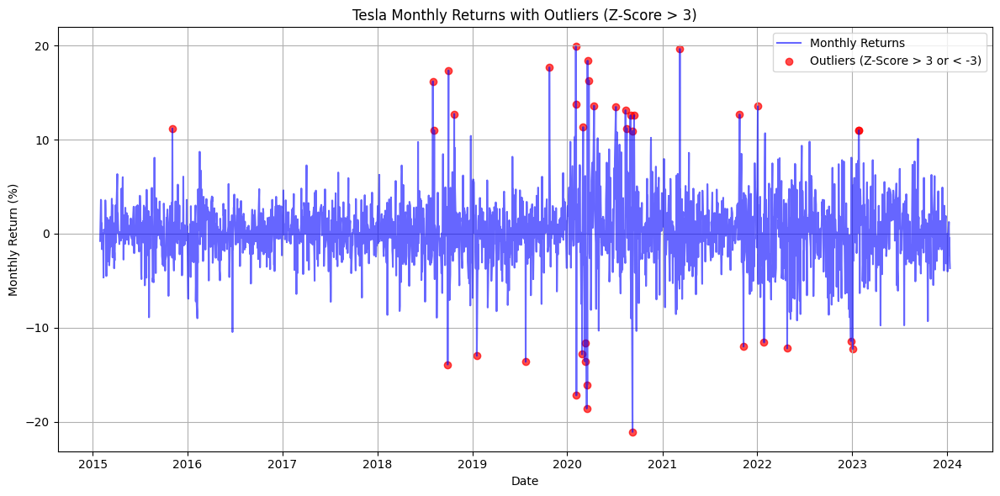

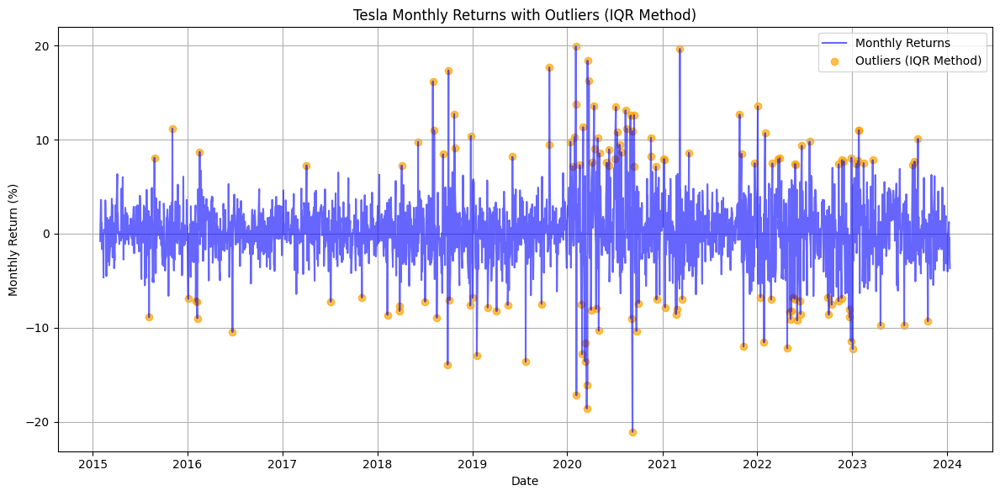

Sharpe Ratio: 0.0519


/Users/rakibabdullah/Desktop/Tesla-S/Utils/EDA.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Cumulative_Return'] = (1 + df['Daily_Return'] / 100).cumprod() - 1
/Users/rakibabdullah/Desktop/Tesla-S/Utils/EDA.py:155: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_yearly = df.resample('Y').last()


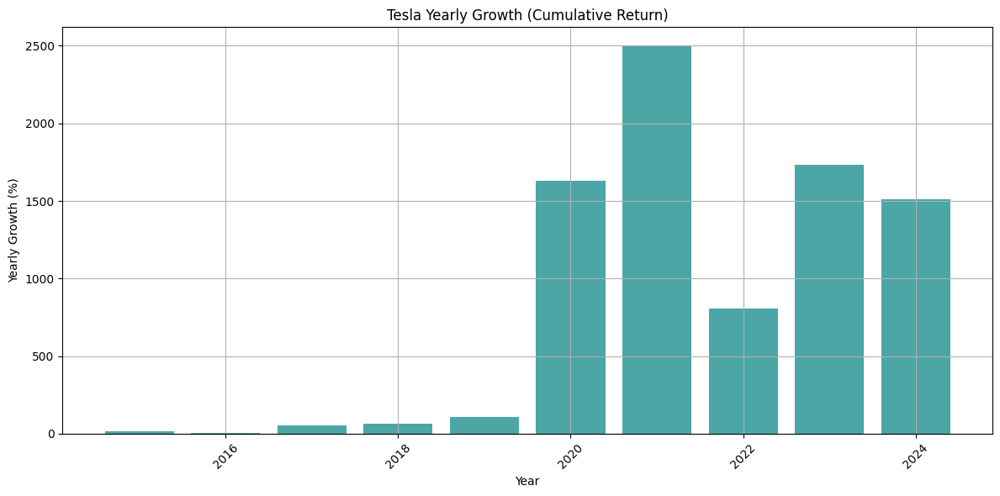

In [9]:
plot_monthly_return_distribution(df_full) # distribution of monthly returns
plot_stock_price_trend(df_full) 
plot_moving_averages(df_full) 

plot_weekly_avg_return(df_full) # weekly average return seasonality
plot_quarterly_seasonality(df_full) # quarterly seasonality

plot_volatility(df_full) #volatility over time
plot_correlation_heatmap(df_full) #correlation heatmap between features
plot_volume_vs_price(df_full) # volume vs price movement

plot_zscore_outliers(df_full) # z-score outliers
plot_iqr_outliers(df_full) 

calculate_sharpe_ratio(df_full)
plot_cumulative_returns(df_full)



# Model Tranining and Testing

In [10]:
results_normal_training = []

## SMA

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0123
Mean Squared Error (MSE): 0.0002
Root Mean Squared Error (RMSE): 0.0157
R-squared (R²): 0.9807
Mean Absolute Percentage Error (MAPE): 2.3518%




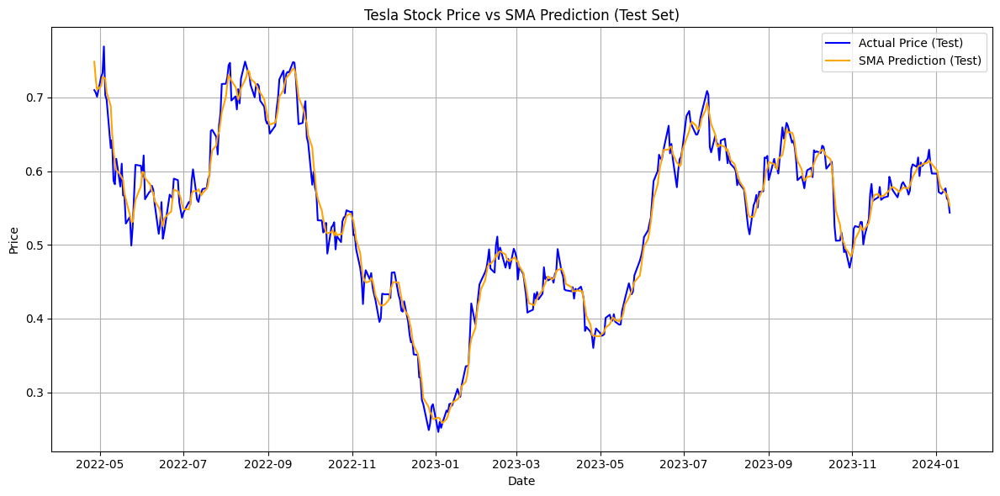

In [11]:
# Apply Simple Moving Average (SMA) to the test set
df_test_scaled['SMA_Prediction'] = simple_moving_average_model(df_test_scaled, window=5)

df_test_scaled.dropna(inplace=True)

mae, mse, rmse, r2, mape=evaluate_model(df_test_scaled['Close'], df_test_scaled['SMA_Prediction'])
results_normal_training.append({
    'Model': 'SMA',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

plot_simple_moving_average(df_test_scaled)

## Linear Regression

In [12]:
y_test, y_pred = linear_regression_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'LR',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
}) 

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0152
Mean Squared Error (MSE): 0.0004
Root Mean Squared Error (RMSE): 0.0204
R-squared (R²): 0.9676
Mean Absolute Percentage Error (MAPE): 26.3507%




/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:281: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:281: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:281: RuntimeWarning: invalid value encountered in matmul
  return X @ coef_.T + self.intercept_


In [13]:
volatility_period_metrics = []

In [14]:
import plotly.graph_objects as go

def plot_test_train_prediction_plotly(model_name, df_train, df_test, y_pred):
    """
    Interactive version of train, test, and predicted stock price plot using Plotly.
    
    Parameters:
    - model_name: str, name of the model for the legend/title
    - df_train: DataFrame containing the training data (must have 'Close' column)
    - df_test: DataFrame containing the test data (must have 'Close' column)
    - y_pred: Predicted values (must match length of df_test)
    """
    
    fig = go.Figure()

    # Train data
    fig.add_trace(go.Scatter(
        x=df_train.index,
        y=df_train['Close'],
        mode='lines',
        name='Train',
        line=dict(color='teal')
    ))

    # Test data
    fig.add_trace(go.Scatter(
        x=df_test.index,
        y=df_test['Close'],
        mode='lines',
        name='Test',
        line=dict(color='magenta')
    ))

    # Predictions
    fig.add_trace(go.Scatter(
        x=df_test.index,
        y=y_pred,
        mode='lines',
        name=f'{model_name} Predictions',
        line=dict(color='blue')
    ))

    # Layout
    fig.update_layout(
        title=f'{model_name} Predictions vs Actual Test Data',
        xaxis_title='Date',
        yaxis_title='Close Price USD ($)',
        legend=dict(x=0, y=1.1, orientation="h"),
        template='plotly_white',
        height=600,
        width=1000,
        margin=dict(l=50, r=50, t=80, b=50),
        hovermode='x unified'
    )

    fig.show()


In [15]:
plot_test_train_prediction("Linear Regression",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Linear Regression",df_train_scaled, df_test_scaled, y_pred)


In [16]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("Linear Regression", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.01523670618139614
Root Mean Squared Error (RMSE) during High Volatility: 0.020582627687747324


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## XGBoost

In [17]:
y_test, y_pred= xgboost_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred)

results_normal_training.append({
    'Model': 'XGB',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0218
Mean Squared Error (MSE): 0.0008
Root Mean Squared Error (RMSE): 0.0275
R-squared (R²): 0.9408
Mean Absolute Percentage Error (MAPE): 4.2407%




In [18]:
plot_test_train_prediction("XGBoost",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("XGBoost",df_train_scaled, df_test_scaled, y_pred)

In [19]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("XgBoost", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.02187793581697514
Root Mean Squared Error (RMSE) during High Volatility: 0.027052474437682415


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## RandomForestRegressor

In [20]:
y_test, y_pred = random_forest_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'RF',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0198
Mean Squared Error (MSE): 0.0007
Root Mean Squared Error (RMSE): 0.0257
R-squared (R²): 0.9485
Mean Absolute Percentage Error (MAPE): 3.8929%




In [21]:
plot_test_train_prediction("Random Forest Regressor",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Random Forest Regressor",df_train_scaled, df_test_scaled, y_pred)

In [22]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("Random forest regressor", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.018432429717834518
Root Mean Squared Error (RMSE) during High Volatility: 0.02213949337222247


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## SVR

In [23]:
y_test, y_pred = svr_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'SVR',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0216
Mean Squared Error (MSE): 0.0007
Root Mean Squared Error (RMSE): 0.0269
R-squared (R²): 0.9436
Mean Absolute Percentage Error (MAPE): 4.4880%




In [24]:
plot_test_train_prediction("Support Vector Regressor",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Support Vector Regressor",df_train_scaled, df_test_scaled, y_pred)

In [25]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("SVR", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.021600810038362953
Root Mean Squared Error (RMSE) during High Volatility: 0.026567293598055697


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## Voting Ensemble Model

In [26]:
y_test, y_pred = voting_model(df_train_scaled, df_test_scaled)
mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred)

results_normal_training.append({
    'Model': 'VE',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0174
Mean Squared Error (MSE): 0.0005
Root Mean Squared Error (RMSE): 0.0225
R-squared (R²): 0.9605
Mean Absolute Percentage Error (MAPE): 3.4453%




/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul



In [27]:
plot_test_train_prediction("Voting Ensemble",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Voting Ensemble",df_train_scaled, df_test_scaled, y_pred)

## Prophet

In [29]:
import pandas as pd

# Load the actual data CSV
df_actual_2024 = pd.read_csv('Data/tesla_2024.csv', parse_dates=['Date'])

# Rename column 'Close/Last' to 'Close'
df_actual_2024.rename(columns={'Close/Last': 'Close'}, inplace=True)

# Drop 'Unnamed: 0' column if it exists
if 'Unnamed: 0' in df_actual_2024.columns:
    df_actual_2024.drop(columns=['Unnamed: 0'], inplace=True)

# Set 'Date' as index inplace
df_actual_2024.set_index('Date', inplace=True)

# Optional: sort index by date
df_actual_2024.sort_index(inplace=True)

# Columns that have $ signs (assuming these are strings)
price_columns = ['Close', 'Open', 'High', 'Low']

for col in price_columns:
    # Remove $ and convert to float
    df_actual_2024[col] = df_actual_2024[col].str.replace('$', '', regex=False)
    df_actual_2024[col] = pd.to_numeric(df_actual_2024[col], errors='coerce')

# For volume, convert to int if needed (remove commas if any)
if df_actual_2024['Volume'].dtype == object:
    df_actual_2024['Volume'] = df_actual_2024['Volume'].str.replace(',', '')
    df_actual_2024['Volume'] = pd.to_numeric(df_actual_2024['Volume'], errors='coerce').astype('Int64')
    
    
desired_order = ['Open', 'High', 'Low', 'Close', 'Volume']
df_actual_2024 = df_actual_2024[desired_order]

df_actual_2024 = df_actual_2024.reset_index()
df_actual_2024.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

# Keep only 'ds' and 'y'
df_actual_2024 = df_actual_2024[['ds', 'y']]


In [30]:
run_and_predict_prophet(df_full,365,df_actual_2024)

09:40:06 - cmdstanpy - INFO - Chain [1] start processing
09:40:06 - cmdstanpy - INFO - Chain [1] done processing
/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1415: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1415: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1415: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1550: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1550: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/forecaster.py:1550: RuntimeWarning:

invalid value encountered in matmul

/Users/rakiba

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-30,14.555329,-17.435453,51.622581,14.555329,14.555329,2.103850,2.103850,2.103850,-0.381431,-0.381431,-0.381431,2.485281,2.485281,2.485281,0.0,0.0,0.0,16.659179
1,2015-02-02,14.568874,-19.778525,55.848755,14.568874,14.568874,4.327478,4.327478,4.327478,0.899646,0.899646,0.899646,3.427833,3.427833,3.427833,0.0,0.0,0.0,18.896352
2,2015-02-03,14.573388,-18.085269,53.823895,14.573388,14.573388,4.039932,4.039932,4.039932,0.219200,0.219200,0.219200,3.820732,3.820732,3.820732,0.0,0.0,0.0,18.613320
3,2015-02-04,14.577903,-17.189215,59.457680,14.577903,14.577903,4.622519,4.622519,4.622519,0.388968,0.388968,0.388968,4.233552,4.233552,4.233552,0.0,0.0,0.0,19.200422
4,2015-02-05,14.582418,-17.268179,56.014645,14.582418,14.582418,4.611357,4.611357,4.611357,-0.041656,-0.041656,-0.041656,4.653013,4.653013,4.653013,0.0,0.0,0.0,19.193775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2614,2025-01-07,149.181638,110.346542,200.581301,124.245290,170.544446,7.003115,7.003115,7.003115,0.219200,0.219200,0.219200,6.783915,6.783915,6.783915,0.0,0.0,0.0,156.184753
2615,2025-01-08,149.053660,112.378517,199.666677,124.090669,170.493246,7.194978,7.194978,7.194978,0.388968,0.388968,0.388968,6.806011,6.806011,6.806011,0.0,0.0,0.0,156.248638
2616,2025-01-09,148.925682,110.034356,202.384937,123.917922,170.442046,6.716980,6.716980,6.716980,-0.041656,-0.041656,-0.041656,6.758636,6.758636,6.758636,0.0,0.0,0.0,155.642661
2617,2025-01-10,148.797704,109.398747,200.313302,123.707998,170.390847,6.261832,6.261832,6.261832,-0.381431,-0.381431,-0.381431,6.643264,6.643264,6.643264,0.0,0.0,0.0,155.059536


In [31]:
import pandas as pd

# Load the dataset
df = pd.read_csv('Data/tesla_2025.csv', parse_dates=['Date'])

# Filter data from 2024-01-01 to 2024-12-31 (1 year)
start_date = '2024-01-01'
end_date = '2024-12-31'
df_2024 = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

# Save the filtered data to a new CSV
df_2024.to_csv('Data/tesla_2024.csv', index=False)

print(f"Filtered data saved: {df_2024.shape[0]} rows from {start_date} to {end_date}")


Filtered data saved: 252 rows from 2024-01-01 to 2024-12-31


## LSTM

In [32]:
import tensorflow as tf
tf.config.set_visible_devices([], 'GPU')


In [33]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"  # Disable GPU


In [34]:
from Utils.Models import *

Reloading Tuner from hyperparameter_tuning/lstm_hyperparameter_tuning/tuner0.json
Best hyperparameters: {'lstm_units_1': 150, 'dropout_1': 0.2, 'lstm_units_2': 200, 'dropout_2': 0.1, 'dense_units': 64, 'learning_rate': 0.00033612834408703365}
Epoch 1/30


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0035 - root_mean_squared_error: 0.0585 - val_loss: 0.0287 - val_root_mean_squared_error: 0.1696
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.5393e-04 - root_mean_squared_error: 0.0159 - val_loss: 0.0025 - val_root_mean_squared_error: 0.0499
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5356e-04 - root_mean_squared_error: 0.0124 - val_loss: 0.0053 - val_root_mean_squared_error: 0.0731
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1907e-04 - root_mean_squared_error: 0.0109 - val_loss: 0.0029 - val_root_mean_squared_error: 0.0535
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1577e-04 - root_mean_squared_error: 0.0107 - val_loss: 0.0033 - val_root_mean_squared_error: 0.0575
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.6028e-05 - root_mean_squared_error: 0.0091 - val_loss: 0.0022 - val_root_mean_squared_error: 0.0473
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - lo

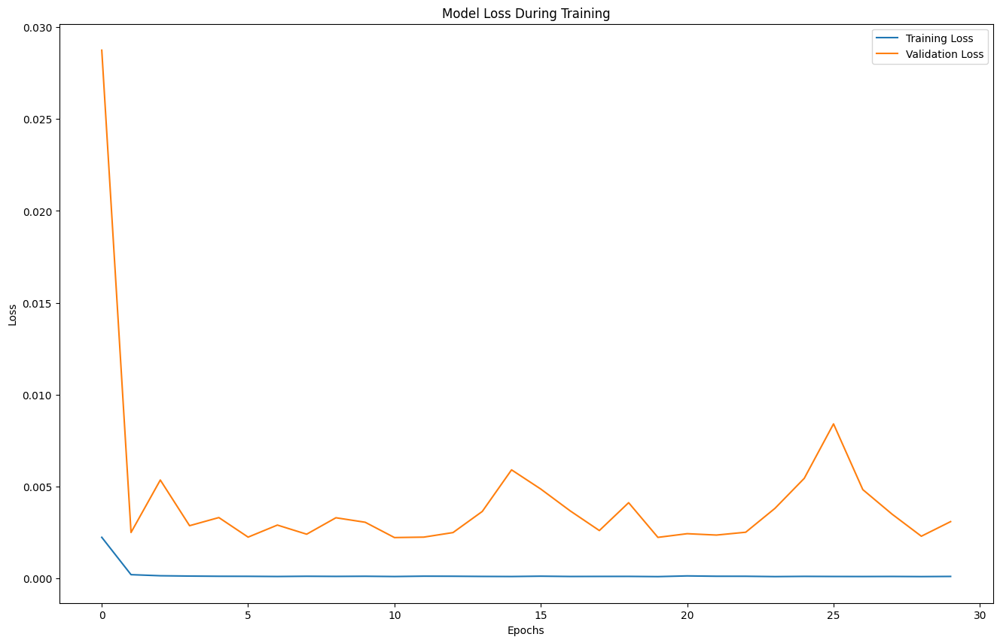

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0323
Mean Squared Error (MSE): 0.0016
Root Mean Squared Error (RMSE): 0.0405
R-squared (R²): 0.8691
Mean Absolute Percentage Error (MAPE): 24.5736%




In [35]:
y_test, y_pred = lstm_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'LSTM',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

In [36]:
plot_test_train_prediction("LSTM",df_train_scaled, df_test_scaled[5:], y_pred)
plot_test_train_prediction_log("LSTM",df_train_scaled, df_test_scaled[5:], y_pred)



In [37]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test[5:], df_test_scaled[5:], y_pred)

volatility_period_metrics.append(("LSTM", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.032018715627972365
Root Mean Squared Error (RMSE) during High Volatility: 0.03818923072389608


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:85: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:88: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:94: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

## GRU Model

Reloading Tuner from hyperparameter_tuning_gru/gru_hyperparameter_tuning/tuner0.json
Best hyperparameters: {'gru_units_1': 150, 'dropout_1': 0.1, 'gru_units_2': 200, 'dropout_2': 0.1, 'gru_units_3': 150, 'dense_units': 96, 'dropout_3': 0.5, 'learning_rate': 8.327414044844959e-05}
Epoch 1/64


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



180/180 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0014 - root_mean_squared_error: 0.0363 - val_loss: 0.0095 - val_root_mean_squared_error: 0.0974
Epoch 2/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.7668e-04 - root_mean_squared_error: 0.0193 - val_loss: 0.0033 - val_root_mean_squared_error: 0.0578
Epoch 3/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.5975e-04 - root_mean_squared_error: 0.0188 - val_loss: 0.0022 - val_root_mean_squared_error: 0.0471
Epoch 4/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.6619e-04 - root_mean_squared_error: 0.0190 - val_loss: 0.0063 - val_root_mean_squared_error: 0.0791
Epoch 5/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.0629e-04 - root_mean_squared_error: 0.0200 - val_loss: 0.0021 - val_root_mean_squared_error: 0.0462
Epoch 6/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.8805e-04 - root_mean_squared_error: 0.0168 - val_loss: 0.0080 - val_root_mean_squared_error: 0.0895
Epoch 7/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 

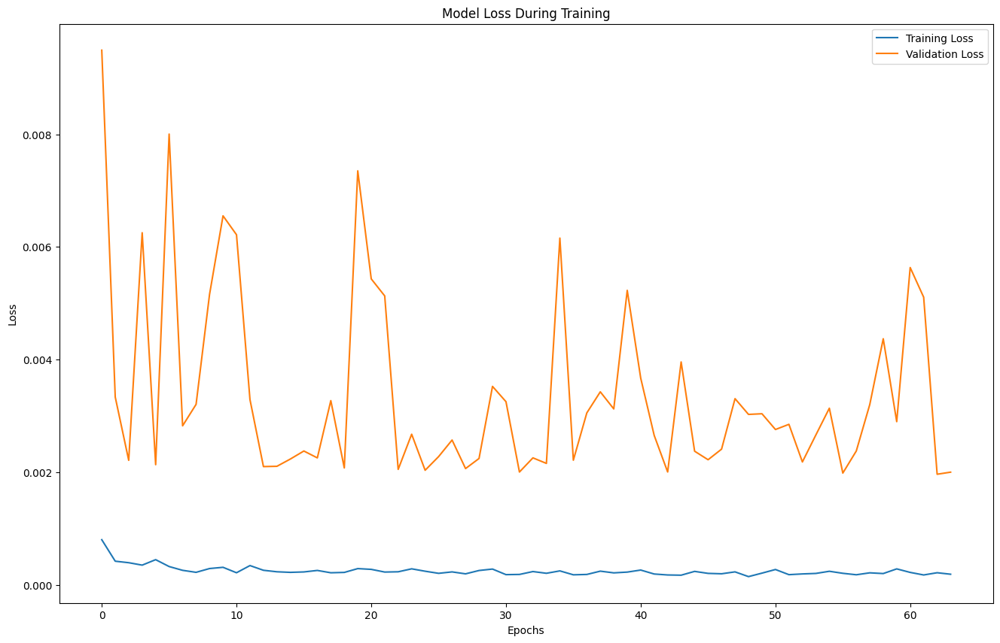

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0324
Mean Squared Error (MSE): 0.0016
Root Mean Squared Error (RMSE): 0.0404
R-squared (R²): 0.8698
Mean Absolute Percentage Error (MAPE): 26.3697%




In [38]:
y_test, y_pred = gru_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred)

results_normal_training.append({
    'Model': 'GRU',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

In [39]:
plot_test_train_prediction("GRU",df_train_scaled, df_test_scaled[5:], y_pred)
plot_test_train_prediction_log("GRU",df_train_scaled, df_test_scaled[5:], y_pred)

In [40]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test[5:], df_test_scaled[5:], y_pred)

volatility_period_metrics.append(("GRU", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.02974775672892832
Root Mean Squared Error (RMSE) during High Volatility: 0.035421919173561016


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:85: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:88: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:94: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

## Performance Comparison of Models at High Volatility Period

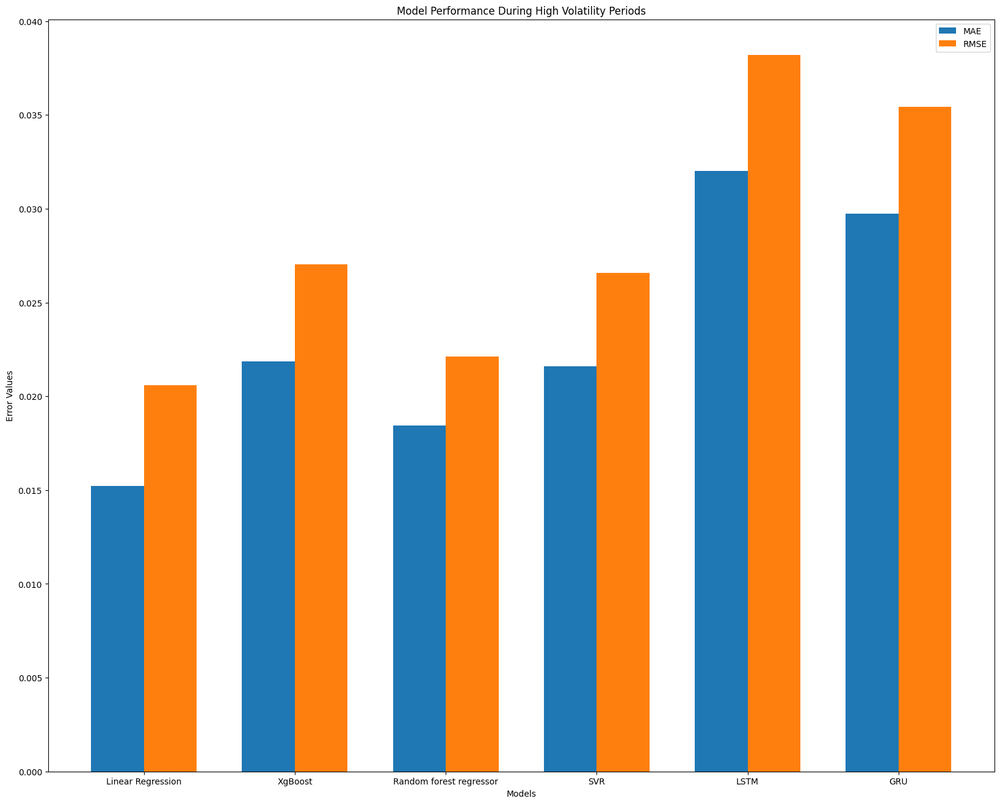

In [41]:
# Separate model names, MAE, and RMSE values
models = [model for model, _, _ in volatility_period_metrics]
mae_values = [mae for _, mae, _ in volatility_period_metrics]
rmse_values = [rmse for _, _, rmse in volatility_period_metrics]

# Plot comparison of MAE and RMSE for different models
x = np.arange(len(models))  # Model index

fig, ax = plt.subplots(figsize=(20, 16))
width = 0.35  # Bar width

# Plotting both MAE and RMSE side by side
bar1 = ax.bar(x - width/2, mae_values, width, label='MAE')
bar2 = ax.bar(x + width/2, rmse_values, width, label='RMSE')

ax.set_xlabel('Models')
ax.set_ylabel('Error Values')
ax.set_title('Model Performance During High Volatility Periods')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

plt.show()


## Walk Forward Validation Approach

Running Walk-Forward Validation for: LR


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_mode

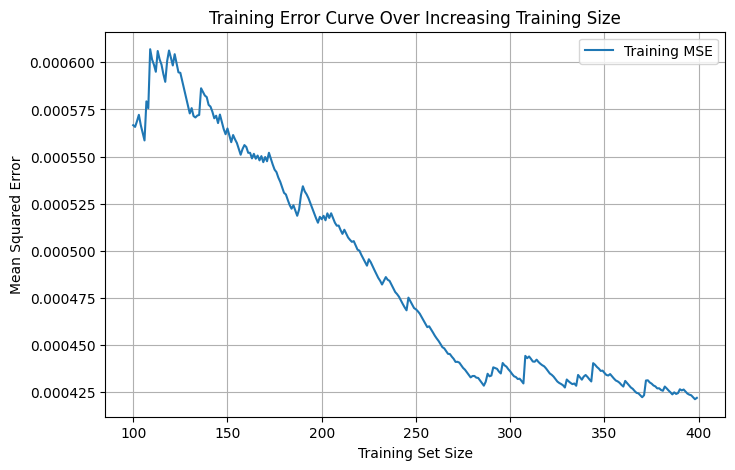

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0150
Mean Squared Error (MSE): 0.0004
Root Mean Squared Error (RMSE): 0.0198
R-squared (R²): 0.9652
Mean Absolute Percentage Error (MAPE): 3.1982%


Running Walk-Forward Validation for: RF


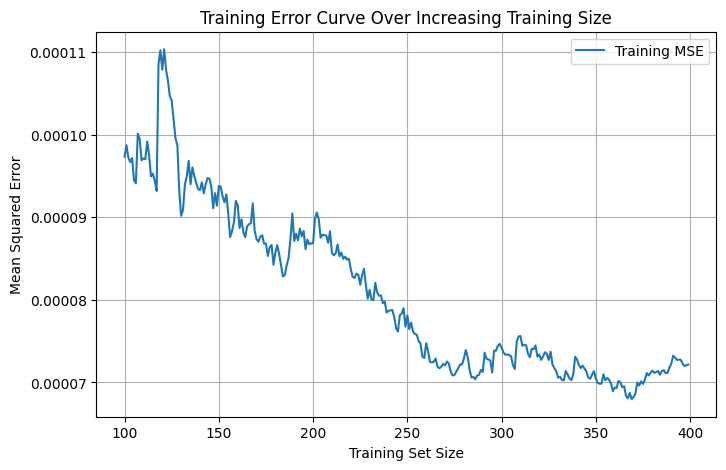

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0319
Mean Squared Error (MSE): 0.0023
Root Mean Squared Error (RMSE): 0.0481
R-squared (R²): 0.7949
Mean Absolute Percentage Error (MAPE): 7.7740%


Running Walk-Forward Validation for: SVR


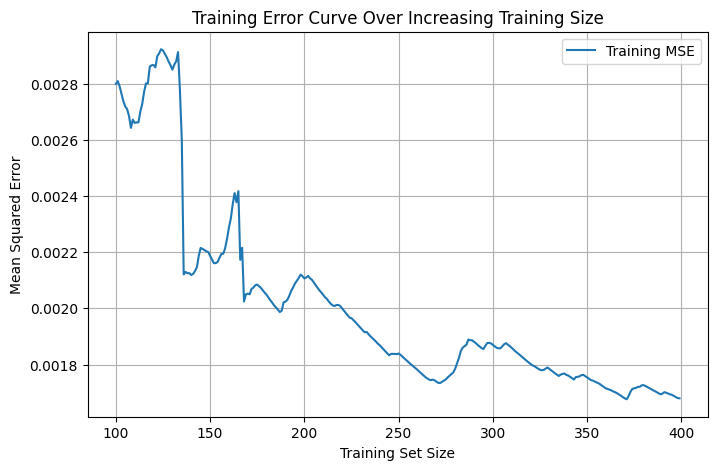

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0418
Mean Squared Error (MSE): 0.0032
Root Mean Squared Error (RMSE): 0.0562
R-squared (R²): 0.7205
Mean Absolute Percentage Error (MAPE): 9.6930%


Running Walk-Forward Validation for: XGB


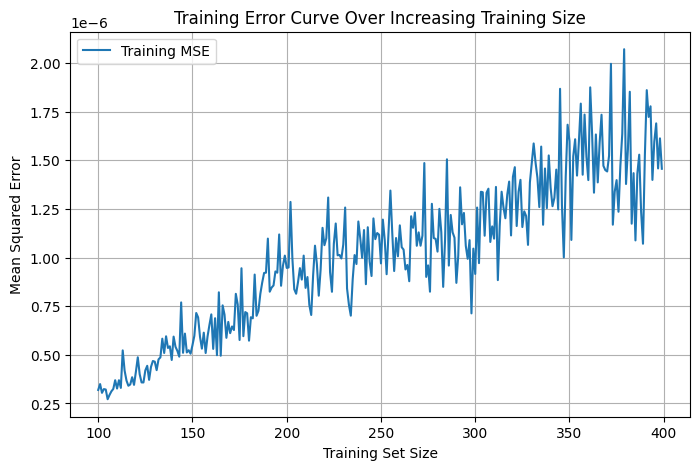

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0356
Mean Squared Error (MSE): 0.0031
Root Mean Squared Error (RMSE): 0.0553
R-squared (R²): 0.7295
Mean Absolute Percentage Error (MAPE): 8.6228%


Running Walk-Forward Validation for: VE


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_mode

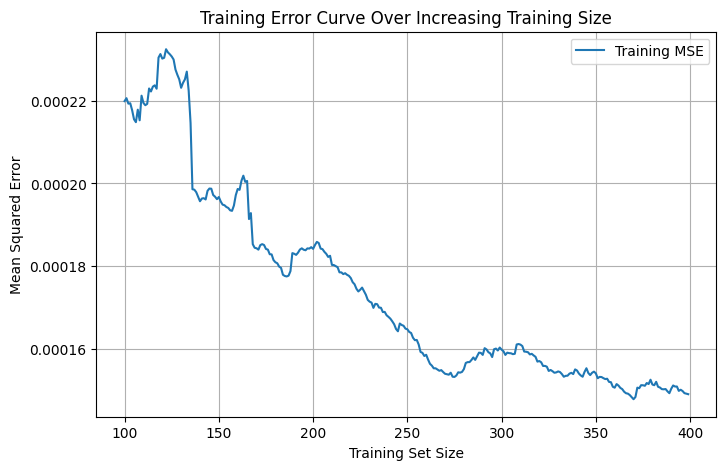

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0295
Mean Squared Error (MSE): 0.0019
Root Mean Squared Error (RMSE): 0.0433
R-squared (R²): 0.8341
Mean Absolute Percentage Error (MAPE): 7.0519%




In [42]:
feature_cols = ['Low', 'High', 'Open', 'Close', 'Volume', 'Monthly_Return', 'MA5', 'MA10', 'MA20']

# List of models with their names
models = [
    ("LR", LinearRegression()),
    ("RF", RandomForestRegressor(n_estimators=100, random_state=42)),
    ("SVR", SVR(kernel='rbf', C=100, epsilon=0.1)),
    #("DT", DecisionTreeRegressor(random_state=42)),
    ("XGB", xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)),
    ("VE", VotingRegressor(estimators=[
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
        ('svr', SVR(kernel='rbf', C=100, epsilon=0.1)),
        ('dt', DecisionTreeRegressor(random_state=42)),
        ('xgb', xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)),
    ]))
]

results_walk_forward_training = []

for name,model_instance in models:
    print(f"Running Walk-Forward Validation for: {name}")
    y_true, y_pred = walk_forward_validation(df_test_scaled, 
                                         model_func=lambda m=model_instance: m, 
                                         feature_cols=feature_cols,
                                         start=100)
    # Evaluate model performance
    mae, mse, rmse, r2, mape=evaluate_model(y_true, y_pred)
    results_walk_forward_training.append({
        'Model': name,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2,
        'MAPE': mape
    })


## Performance of Models based on Different Evaluation Metices

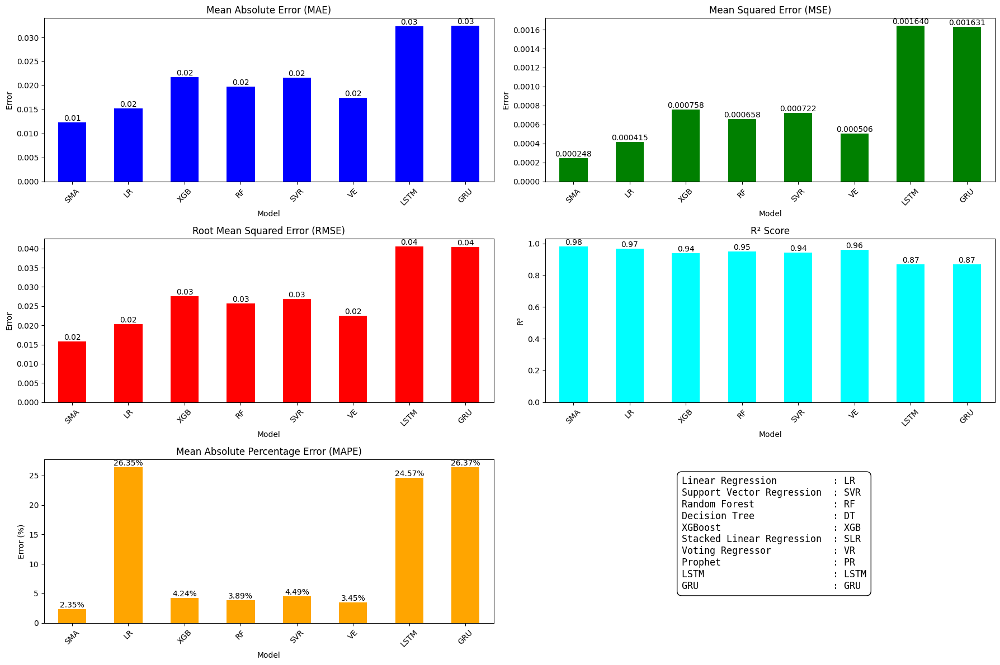

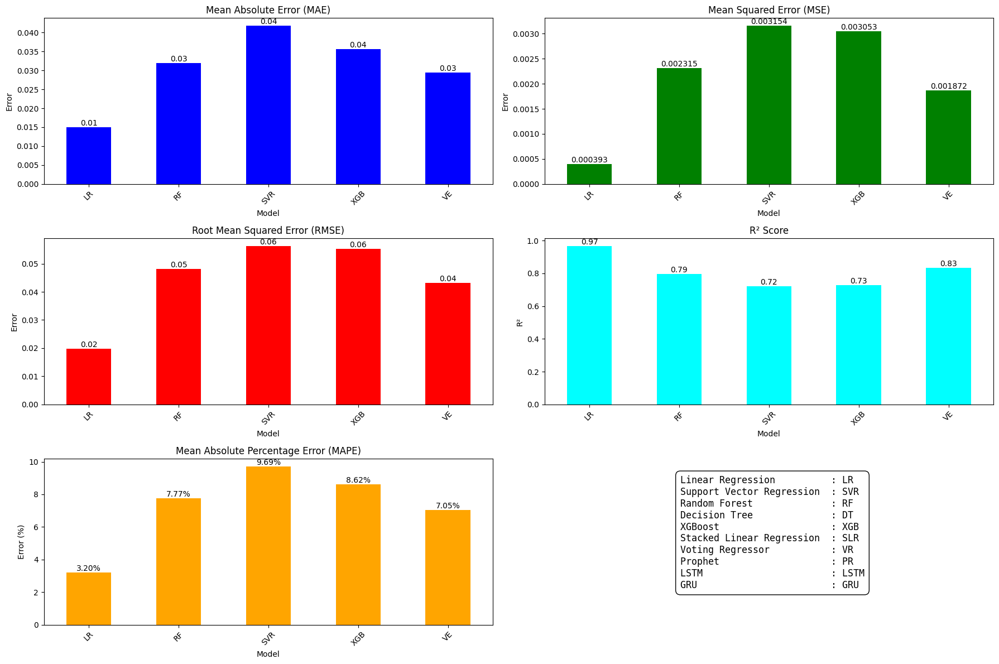

In [43]:
plot_model_comparsion(results_normal_training)
plot_model_comparsion(results_walk_forward_training)

In [44]:
import sys
print(sys.executable)
print(sys.version)


/Library/Developer/CommandLineTools/usr/bin/python3
3.9.6 (default, Mar 12 2025, 20:22:46) 
[Clang 17.0.0 (clang-1700.0.13.3)]


# Model Tranining and Testing

In [45]:
results_normal_training = []

## SMA

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0123
Mean Squared Error (MSE): 0.0002
Root Mean Squared Error (RMSE): 0.0157
R-squared (R²): 0.9807
Mean Absolute Percentage Error (MAPE): 2.3491%




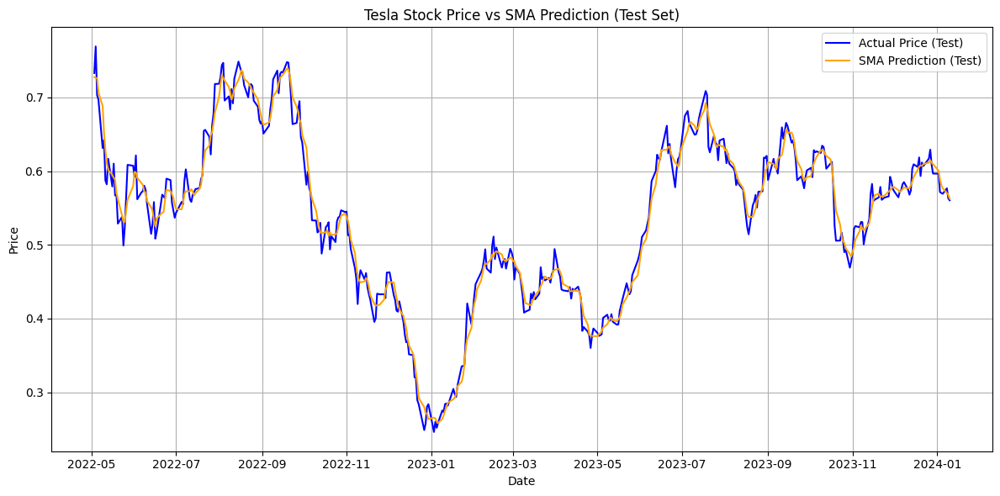

In [46]:
# Apply Simple Moving Average (SMA) to the test set
df_test_scaled['SMA_Prediction'] = simple_moving_average_model(df_test_scaled, window=5)

df_test_scaled.dropna(inplace=True)

mae, mse, rmse, r2, mape=evaluate_model(df_test_scaled['Close'], df_test_scaled['SMA_Prediction'])
results_normal_training.append({
    'Model': 'SMA',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

plot_simple_moving_average(df_test_scaled)

## Linear Regression

In [47]:
y_test, y_pred = linear_regression_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'LR',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
}) 

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0153
Mean Squared Error (MSE): 0.0004
Root Mean Squared Error (RMSE): 0.0204
R-squared (R²): 0.9670
Mean Absolute Percentage Error (MAPE): 26.2758%




/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:281: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:281: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:281: RuntimeWarning:

invalid value encountered in matmul



In [48]:
volatility_period_metrics = []

In [49]:
import plotly.graph_objects as go

def plot_test_train_prediction_plotly(model_name, df_train, df_test, y_pred):
    """
    Interactive version of train, test, and predicted stock price plot using Plotly.
    
    Parameters:
    - model_name: str, name of the model for the legend/title
    - df_train: DataFrame containing the training data (must have 'Close' column)
    - df_test: DataFrame containing the test data (must have 'Close' column)
    - y_pred: Predicted values (must match length of df_test)
    """
    
    fig = go.Figure()

    # Train data
    fig.add_trace(go.Scatter(
        x=df_train.index,
        y=df_train['Close'],
        mode='lines',
        name='Train',
        line=dict(color='teal')
    ))

    # Test data
    fig.add_trace(go.Scatter(
        x=df_test.index,
        y=df_test['Close'],
        mode='lines',
        name='Test',
        line=dict(color='magenta')
    ))

    # Predictions
    fig.add_trace(go.Scatter(
        x=df_test.index,
        y=y_pred,
        mode='lines',
        name=f'{model_name} Predictions',
        line=dict(color='blue')
    ))

    # Layout
    fig.update_layout(
        title=f'{model_name} Predictions vs Actual Test Data',
        xaxis_title='Date',
        yaxis_title='Close Price USD ($)',
        legend=dict(x=0, y=1.1, orientation="h"),
        template='plotly_white',
        height=600,
        width=1000,
        margin=dict(l=50, r=50, t=80, b=50),
        hovermode='x unified'
    )

    fig.show()


In [50]:
plot_test_train_prediction("Linear Regression",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Linear Regression",df_train_scaled, df_test_scaled, y_pred)


In [51]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("Linear Regression", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.01523670618139614
Root Mean Squared Error (RMSE) during High Volatility: 0.020582627687747324


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## XGBoost

In [52]:
y_test, y_pred= xgboost_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred)

results_normal_training.append({
    'Model': 'XGB',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0218
Mean Squared Error (MSE): 0.0008
Root Mean Squared Error (RMSE): 0.0276
R-squared (R²): 0.9399
Mean Absolute Percentage Error (MAPE): 4.2508%




In [53]:
plot_test_train_prediction("XGBoost",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("XGBoost",df_train_scaled, df_test_scaled, y_pred)

In [54]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("XgBoost", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.02187793581697514
Root Mean Squared Error (RMSE) during High Volatility: 0.027052474437682415


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## RandomForestRegressor

In [55]:
y_test, y_pred = random_forest_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'RF',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0199
Mean Squared Error (MSE): 0.0007
Root Mean Squared Error (RMSE): 0.0258
R-squared (R²): 0.9475
Mean Absolute Percentage Error (MAPE): 3.9167%




In [56]:
plot_test_train_prediction("Random Forest Regressor",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Random Forest Regressor",df_train_scaled, df_test_scaled, y_pred)

In [57]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("Random forest regressor", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.018432429717834518
Root Mean Squared Error (RMSE) during High Volatility: 0.02213949337222247


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## SVR

In [58]:
y_test, y_pred = svr_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'SVR',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0217
Mean Squared Error (MSE): 0.0007
Root Mean Squared Error (RMSE): 0.0270
R-squared (R²): 0.9425
Mean Absolute Percentage Error (MAPE): 4.5138%




In [59]:
plot_test_train_prediction("Support Vector Regressor",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Support Vector Regressor",df_train_scaled, df_test_scaled, y_pred)

In [60]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test, df_test_scaled, y_pred)

volatility_period_metrics.append(("SVR", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.021600810038362953
Root Mean Squared Error (RMSE) during High Volatility: 0.026567293598055697


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:108: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## Voting Ensemble Model

In [61]:
y_test, y_pred = voting_model(df_train_scaled, df_test_scaled)
mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred)

results_normal_training.append({
    'Model': 'VE',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0175
Mean Squared Error (MSE): 0.0005
Root Mean Squared Error (RMSE): 0.0226
R-squared (R²): 0.9597
Mean Absolute Percentage Error (MAPE): 3.4652%




/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul



In [62]:
plot_test_train_prediction("Voting Ensemble",df_train_scaled, df_test_scaled, y_pred)
plot_test_train_prediction_log("Voting Ensemble",df_train_scaled, df_test_scaled, y_pred)

In [63]:
# from pylab import rcParams
# import statsmodels.api as sm
# rcParams['figure.figsize'] = 20, 10
# decomposition = sm.tsa.seasonal_decompose(df_full.Close, model='multiplicative',period=252) # additive seasonal index
# fig = decomposition.plot()
# plt.show()

# train_len = int(len(df_full) * 0.83) # 80% of the data for training
# train = df_full[0:train_len] 
# test = df_full[train_len:] 

# from statsmodels.tsa.stattools import adfuller
# adf_test = adfuller(df_full['Close'])

# print('ADF Statistic: %f' % adf_test[0])
# print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
# print('p-value: %f' % adf_test[1])


# from scipy.stats import boxcox
# data_boxcox = pd.Series(boxcox(df_full['Close'], lmbda=0), index = df_full.index)

# df_full['Close'].plot(figsize=(20, 5))
# plt.grid()
# plt.plot(data_boxcox, label='After Box Cox tranformation')
# plt.legend(loc='best')
# plt.title('After Box Cox transform')
# plt.show()

# data_boxcox_diff = pd.Series(data_boxcox - data_boxcox.shift(), df_full.index)
# plt.figure(figsize=(20,5))
# plt.grid()
# plt.plot(data_boxcox_diff, label='After Box Cox tranformation and differencing')
# plt.legend(loc='best')
# plt.title('After Box Cox transform and differencing')
# plt.show()

# data_boxcox_diff.dropna(inplace=True)

# adf_test = adfuller(data_boxcox_diff)

# print('ADF Statistic: %f' % adf_test[0])
# print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
# print('p-value: %f' % adf_test[1])

# train_data_boxcox = data_boxcox[:train_len]
# test_data_boxcox = data_boxcox[train_len:]
# train_data_boxcox_diff = data_boxcox_diff[:train_len-1]
# test_data_boxcox_diff = data_boxcox_diff[train_len-1:]


## Prophet

In [64]:
import pandas as pd

# Load the actual data CSV
df_actual_2024 = pd.read_csv('Data/tesla_2024.csv', parse_dates=['Date'])

# Rename column 'Close/Last' to 'Close'
df_actual_2024.rename(columns={'Close/Last': 'Close'}, inplace=True)

# Drop 'Unnamed: 0' column if it exists
if 'Unnamed: 0' in df_actual_2024.columns:
    df_actual_2024.drop(columns=['Unnamed: 0'], inplace=True)

# Set 'Date' as index inplace
df_actual_2024.set_index('Date', inplace=True)

# Optional: sort index by date
df_actual_2024.sort_index(inplace=True)

# Columns that have $ signs (assuming these are strings)
price_columns = ['Close', 'Open', 'High', 'Low']

for col in price_columns:
    # Remove $ and convert to float
    df_actual_2024[col] = df_actual_2024[col].str.replace('$', '', regex=False)
    df_actual_2024[col] = pd.to_numeric(df_actual_2024[col], errors='coerce')

# For volume, convert to int if needed (remove commas if any)
if df_actual_2024['Volume'].dtype == object:
    df_actual_2024['Volume'] = df_actual_2024['Volume'].str.replace(',', '')
    df_actual_2024['Volume'] = pd.to_numeric(df_actual_2024['Volume'], errors='coerce').astype('Int64')
    
    
desired_order = ['Open', 'High', 'Low', 'Close', 'Volume']
df_actual_2024 = df_actual_2024[desired_order]

df_actual_2024 = df_actual_2024.reset_index()
df_actual_2024.rename(columns={'Date': 'ds', 'Close': 'y'}, inplace=True)

# Keep only 'ds' and 'y'
df_actual_2024 = df_actual_2024[['ds', 'y']]


In [65]:
run_and_predict_prophet(df_full,365,df_actual_2024)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /var/folders/l6/p19rndmd6pv9v2jjnhyd7qg40000gn/T/tmpdwnwu1a6/gaqcjbsb.json
DEBUG:cmdstanpy:input tempfile: /var/folders/l6/p19rndmd6pv9v2jjnhyd7qg40000gn/T/tmpdwnwu1a6/trvzkgk2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67160', 'data', 'file=/var/folders/l6/p19rndmd6pv9v2jjnhyd7qg40000gn/T/tmpdwnwu1a6/gaqcjbsb.json', 'init=/var/folders/l6/p19rndmd6pv9v2jjnhyd7qg40000gn/T/tmpdwnwu1a6/trvzkgk2.json', 'output', 'file=/var/folders/l6/p19rndmd6pv9v2jjnhyd7qg40000gn/T/tmpdwnwu1a6/prophet_modelyu_zn_7i/prophet_model-20250527094253.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:42:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start proce

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-30,14.555329,-22.972092,52.187770,14.555329,14.555329,2.103850,2.103850,2.103850,-0.381431,-0.381431,-0.381431,2.485281,2.485281,2.485281,0.0,0.0,0.0,16.659179
1,2015-02-02,14.568874,-19.956140,54.426923,14.568874,14.568874,4.327478,4.327478,4.327478,0.899646,0.899646,0.899646,3.427833,3.427833,3.427833,0.0,0.0,0.0,18.896352
2,2015-02-03,14.573388,-17.554195,54.446901,14.573388,14.573388,4.039932,4.039932,4.039932,0.219200,0.219200,0.219200,3.820732,3.820732,3.820732,0.0,0.0,0.0,18.613320
3,2015-02-04,14.577903,-16.889204,55.674239,14.577903,14.577903,4.622519,4.622519,4.622519,0.388968,0.388968,0.388968,4.233552,4.233552,4.233552,0.0,0.0,0.0,19.200422
4,2015-02-05,14.582418,-16.877297,57.483418,14.582418,14.582418,4.611357,4.611357,4.611357,-0.041656,-0.041656,-0.041656,4.653013,4.653013,4.653013,0.0,0.0,0.0,19.193775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2614,2025-01-07,149.181638,113.662453,200.999487,123.806231,174.761465,7.003115,7.003115,7.003115,0.219200,0.219200,0.219200,6.783915,6.783915,6.783915,0.0,0.0,0.0,156.184753
2615,2025-01-08,149.053660,111.457991,200.225996,123.561774,174.775163,7.194978,7.194978,7.194978,0.388968,0.388968,0.388968,6.806011,6.806011,6.806011,0.0,0.0,0.0,156.248638
2616,2025-01-09,148.925682,108.938692,197.419453,123.235962,174.857277,6.716980,6.716980,6.716980,-0.041656,-0.041656,-0.041656,6.758636,6.758636,6.758636,0.0,0.0,0.0,155.642661
2617,2025-01-10,148.797704,109.074151,198.845401,122.910772,174.845280,6.261832,6.261832,6.261832,-0.381431,-0.381431,-0.381431,6.643264,6.643264,6.643264,0.0,0.0,0.0,155.059536


In [66]:
import pandas as pd

# Load the dataset
df = pd.read_csv('Data/tesla_2025.csv', parse_dates=['Date'])

# Filter data from 2024-01-01 to 2024-12-31 (1 year)
start_date = '2024-01-01'
end_date = '2024-12-31'
df_2024 = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

# Save the filtered data to a new CSV
df_2024.to_csv('Data/tesla_2024.csv', index=False)

print(f"Filtered data saved: {df_2024.shape[0]} rows from {start_date} to {end_date}")


Filtered data saved: 252 rows from 2024-01-01 to 2024-12-31


## LSTM

In [67]:
import tensorflow as tf
tf.config.set_visible_devices([], 'GPU')


In [68]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"  # Disable GPU


In [69]:
from Utils.Models import *

Reloading Tuner from hyperparameter_tuning/lstm_hyperparameter_tuning/tuner0.json
Best hyperparameters: {'lstm_units_1': 150, 'dropout_1': 0.2, 'lstm_units_2': 200, 'dropout_2': 0.1, 'dense_units': 64, 'learning_rate': 0.00033612834408703365}
Epoch 1/30


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0030 - root_mean_squared_error: 0.0537 - val_loss: 0.0044 - val_root_mean_squared_error: 0.0666
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.9653e-04 - root_mean_squared_error: 0.0139 - val_loss: 0.0027 - val_root_mean_squared_error: 0.0521
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.2814e-04 - root_mean_squared_error: 0.0113 - val_loss: 0.0027 - val_root_mean_squared_error: 0.0516
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5082e-04 - root_mean_squared_error: 0.0121 - val_loss: 0.0023 - val_root_mean_squared_error: 0.0484
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.5122e-05 - root_mean_squared_error: 0.0091 - val_loss: 0.0026 - val_root_mean_squared_error: 0.0514
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 9.1105e-05 - root_mean_squared_error: 0.0094 - val_loss: 0.0022 - val_root_mean_squared_error: 0.0473
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - l

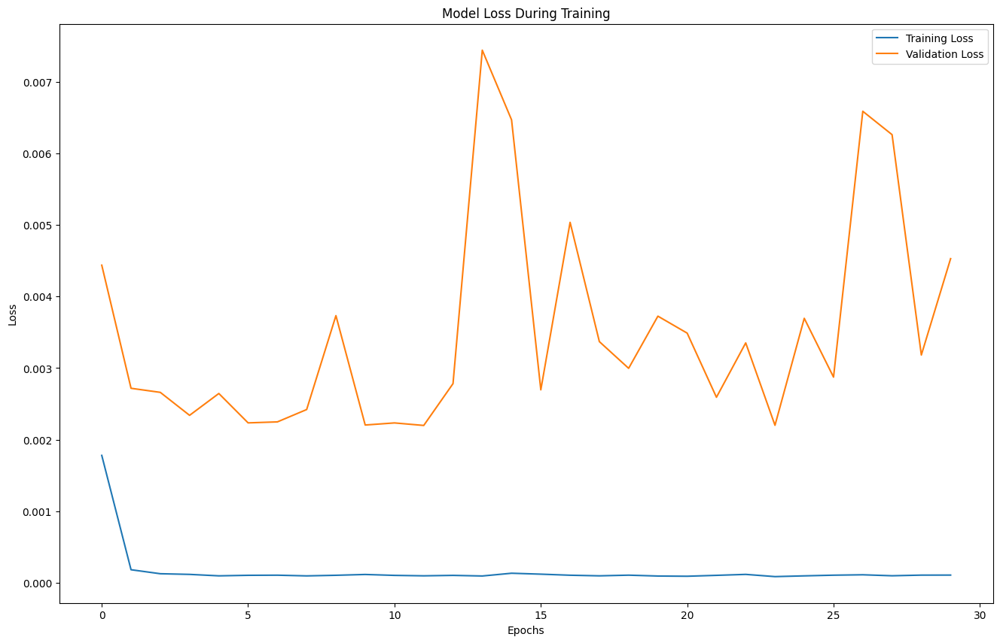

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0381
Mean Squared Error (MSE): 0.0022
Root Mean Squared Error (RMSE): 0.0473
R-squared (R²): 0.8213
Mean Absolute Percentage Error (MAPE): 24.0569%




In [70]:
y_test, y_pred = lstm_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred) 

results_normal_training.append({
    'Model': 'LSTM',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

In [71]:
plot_test_train_prediction("LSTM",df_train_scaled, df_test_scaled[5:], y_pred)
plot_test_train_prediction_log("LSTM",df_train_scaled, df_test_scaled[5:], y_pred)



In [72]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test[5:], df_test_scaled[5:], y_pred)

volatility_period_metrics.append(("LSTM", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.03732006566081513
Root Mean Squared Error (RMSE) during High Volatility: 0.044915805328902575


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:85: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:88: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:94: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

## GRU Model

Reloading Tuner from hyperparameter_tuning_gru/gru_hyperparameter_tuning/tuner0.json
Best hyperparameters: {'gru_units_1': 150, 'dropout_1': 0.1, 'gru_units_2': 200, 'dropout_2': 0.1, 'gru_units_3': 150, 'dense_units': 96, 'dropout_3': 0.5, 'learning_rate': 8.327414044844959e-05}
Epoch 1/64


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



180/180 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0019 - root_mean_squared_error: 0.0433 - val_loss: 0.0070 - val_root_mean_squared_error: 0.0834
Epoch 2/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.2774e-04 - root_mean_squared_error: 0.0205 - val_loss: 0.0046 - val_root_mean_squared_error: 0.0676
Epoch 3/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.9138e-04 - root_mean_squared_error: 0.0197 - val_loss: 0.0076 - val_root_mean_squared_error: 0.0871
Epoch 4/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.2654e-04 - root_mean_squared_error: 0.0205 - val_loss: 0.0125 - val_root_mean_squared_error: 0.1120
Epoch 5/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.6927e-04 - root_mean_squared_error: 0.0215 - val_loss: 0.0045 - val_root_mean_squared_error: 0.0672
Epoch 6/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 3.3662e-04 - root_mean_squared_error: 0.0182 - val_loss: 0.0037 - val_root_mean_squared_error: 0.0607
Epoch 7/64
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 

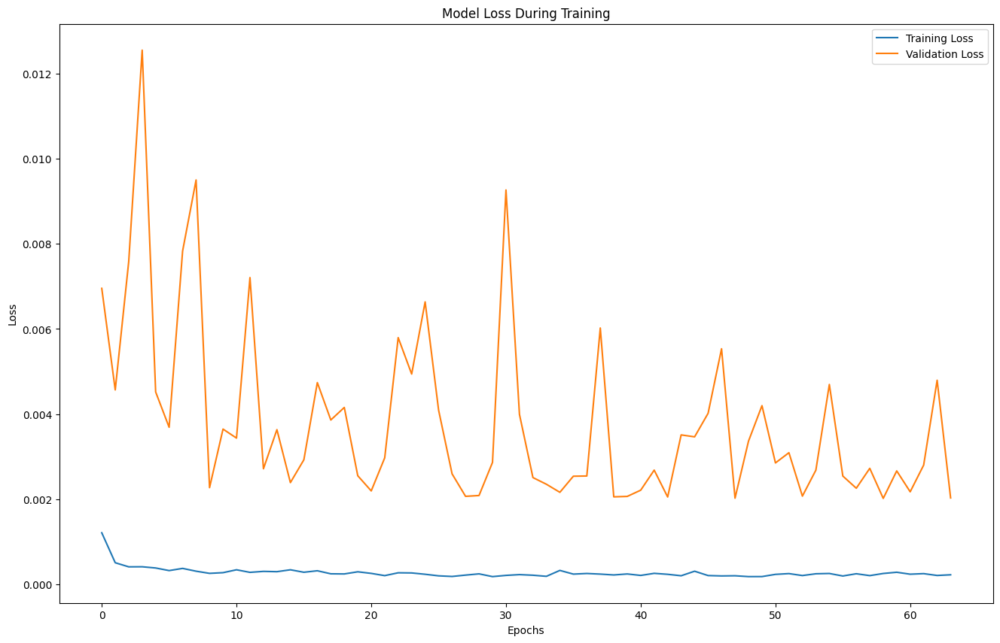

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0310
Mean Squared Error (MSE): 0.0015
Root Mean Squared Error (RMSE): 0.0385
R-squared (R²): 0.8812
Mean Absolute Percentage Error (MAPE): 25.8300%




In [73]:
y_test, y_pred = gru_model(df_train_scaled, df_test_scaled)

mae, mse, rmse, r2, mape=evaluate_model(y_test, y_pred)

results_normal_training.append({
    'Model': 'GRU',
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse,
    'R2': r2,
    'MAPE': mape
})

In [74]:
plot_test_train_prediction("GRU",df_train_scaled, df_test_scaled[5:], y_pred)
plot_test_train_prediction_log("GRU",df_train_scaled, df_test_scaled[5:], y_pred)

In [75]:
mae_volatility,rmse_volatility=volatility_error_plot(df_test[5:], df_test_scaled[5:], y_pred)

volatility_period_metrics.append(("GRU", mae_volatility, rmse_volatility))

Mean Absolute Error (MAE) during High Volatility: 0.030443018088143103
Root Mean Squared Error (RMSE) during High Volatility: 0.035742667964677774


/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:85: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:88: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/rakibabdullah/Desktop/Tesla-S/Utils/Evaluation.py:94: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

## Performance Comparison of Models at High Volatility Period

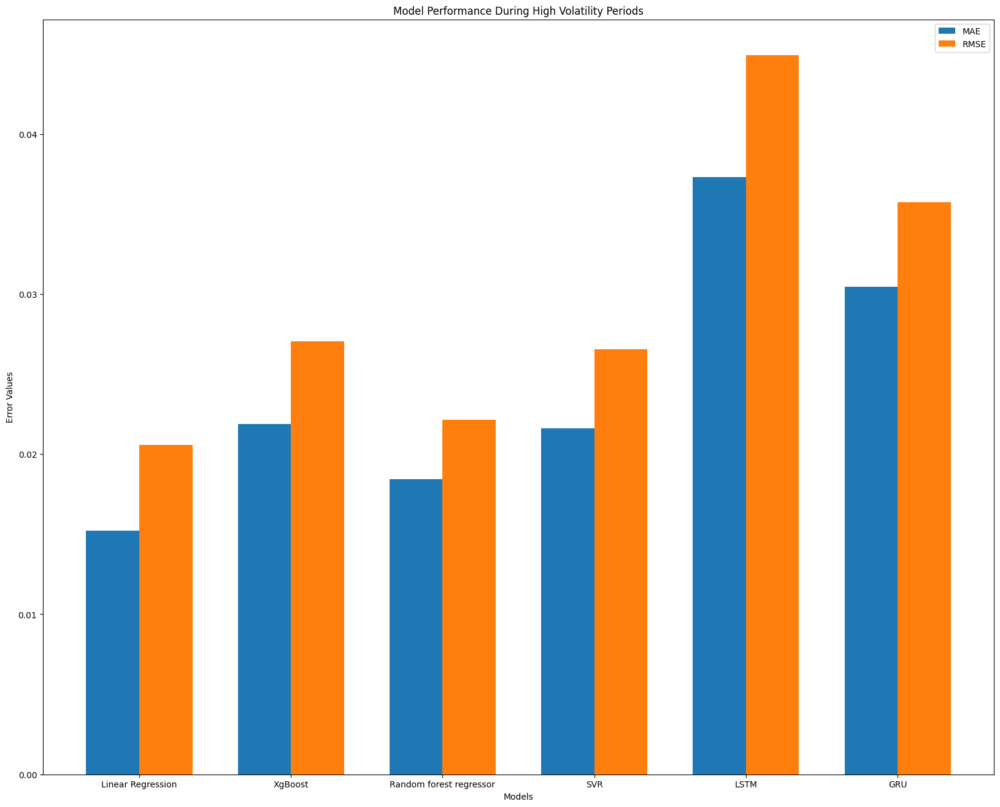

In [76]:
# Separate model names, MAE, and RMSE values
models = [model for model, _, _ in volatility_period_metrics]
mae_values = [mae for _, mae, _ in volatility_period_metrics]
rmse_values = [rmse for _, _, rmse in volatility_period_metrics]

# Plot comparison of MAE and RMSE for different models
x = np.arange(len(models))  # Model index

fig, ax = plt.subplots(figsize=(20, 16))
width = 0.35  # Bar width

# Plotting both MAE and RMSE side by side
bar1 = ax.bar(x - width/2, mae_values, width, label='MAE')
bar2 = ax.bar(x + width/2, rmse_values, width, label='RMSE')

ax.set_xlabel('Models')
ax.set_ylabel('Error Values')
ax.set_title('Model Performance During High Volatility Periods')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

plt.show()


## Walk Forward Validation Approach

Running Walk-Forward Validation for: LR


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_mode

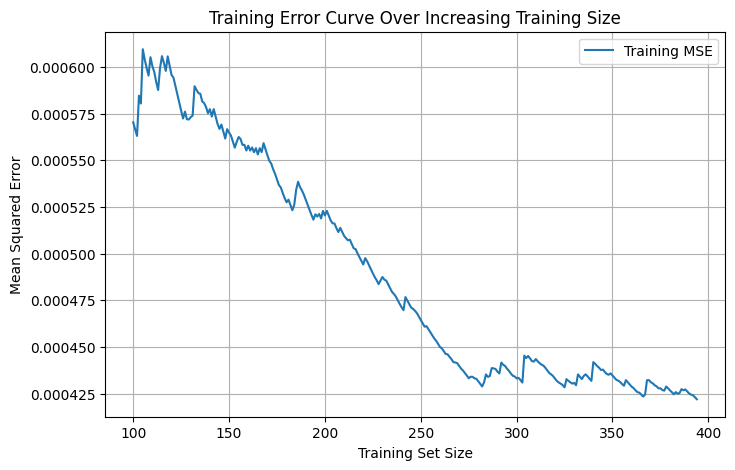

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0152
Mean Squared Error (MSE): 0.0004
Root Mean Squared Error (RMSE): 0.0201
R-squared (R²): 0.9645
Mean Absolute Percentage Error (MAPE): 3.2700%


Running Walk-Forward Validation for: RF


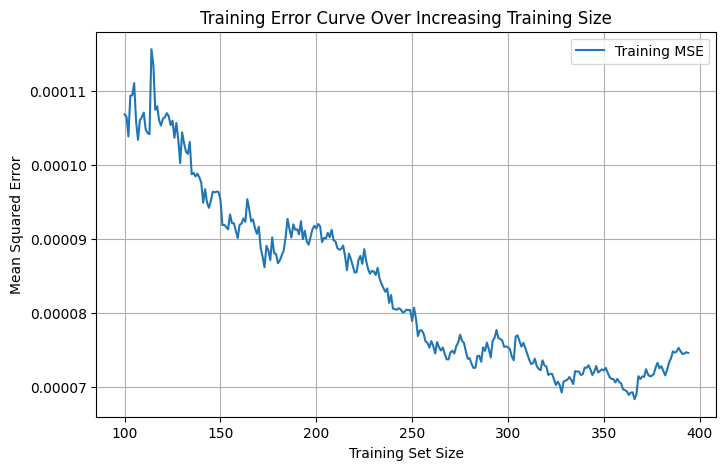

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0313
Mean Squared Error (MSE): 0.0023
Root Mean Squared Error (RMSE): 0.0476
R-squared (R²): 0.8005
Mean Absolute Percentage Error (MAPE): 7.6705%


Running Walk-Forward Validation for: SVR


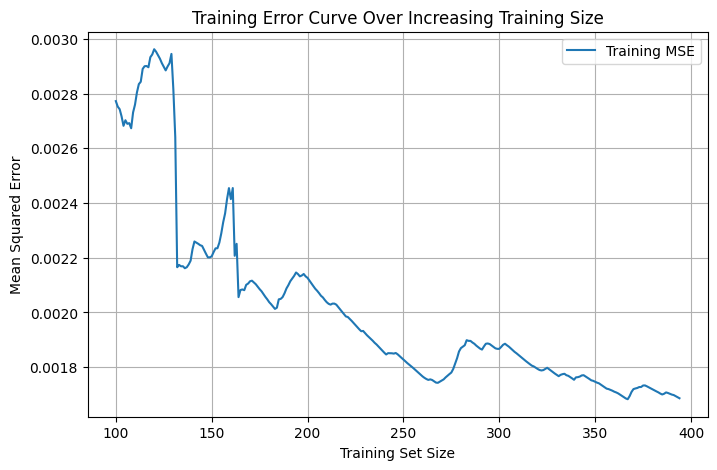

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0418
Mean Squared Error (MSE): 0.0032
Root Mean Squared Error (RMSE): 0.0563
R-squared (R²): 0.7206
Mean Absolute Percentage Error (MAPE): 9.7320%


Running Walk-Forward Validation for: XGB


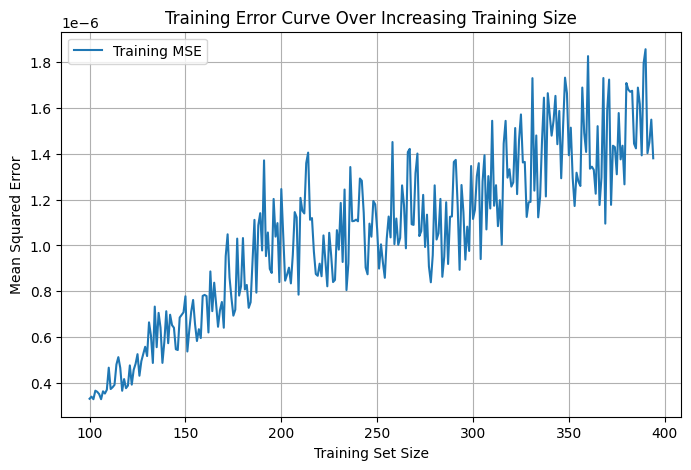

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0354
Mean Squared Error (MSE): 0.0030
Root Mean Squared Error (RMSE): 0.0550
R-squared (R²): 0.7336
Mean Absolute Percentage Error (MAPE): 8.6394%


Running Walk-Forward Validation for: VE


/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

divide by zero encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

overflow encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_base.py:279: RuntimeWarning:

invalid value encountered in matmul

/Users/rakibabdullah/Library/Python/3.9/lib/python/site-packages/sklearn/linear_mode

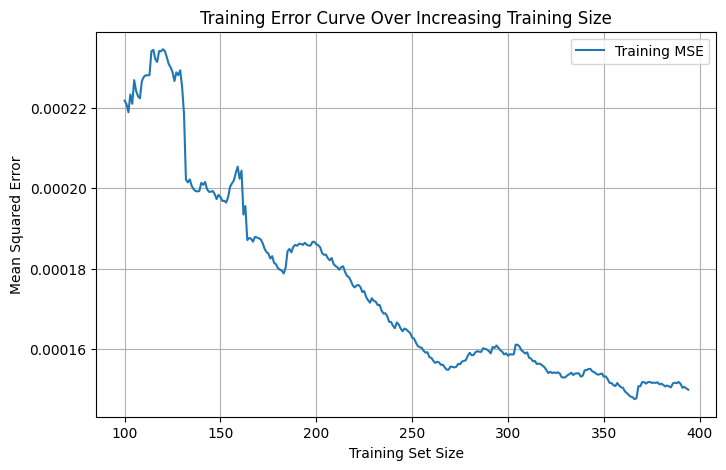

Model Evaluation Metrics:
Mean Absolute Error (MAE): 0.0294
Mean Squared Error (MSE): 0.0019
Root Mean Squared Error (RMSE): 0.0434
R-squared (R²): 0.8341
Mean Absolute Percentage Error (MAPE): 7.0747%




In [77]:
feature_cols = ['Low', 'High', 'Open', 'Close', 'Volume', 'Monthly_Return', 'MA5', 'MA10', 'MA20']

# List of models with their names
models = [
    ("LR", LinearRegression()),
    ("RF", RandomForestRegressor(n_estimators=100, random_state=42)),
    ("SVR", SVR(kernel='rbf', C=100, epsilon=0.1)),
    #("DT", DecisionTreeRegressor(random_state=42)),
    ("XGB", xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)),
    ("VE", VotingRegressor(estimators=[
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
        ('svr', SVR(kernel='rbf', C=100, epsilon=0.1)),
        ('dt', DecisionTreeRegressor(random_state=42)),
        ('xgb', xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)),
    ]))
]

results_walk_forward_training = []

for name,model_instance in models:
    print(f"Running Walk-Forward Validation for: {name}")
    y_true, y_pred = walk_forward_validation(df_test_scaled, 
                                         model_func=lambda m=model_instance: m, 
                                         feature_cols=feature_cols,
                                         start=100)
    # Evaluate model performance
    mae, mse, rmse, r2, mape=evaluate_model(y_true, y_pred)
    results_walk_forward_training.append({
        'Model': name,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2,
        'MAPE': mape
    })


## Performance of Models based on Different Evaluation Metices

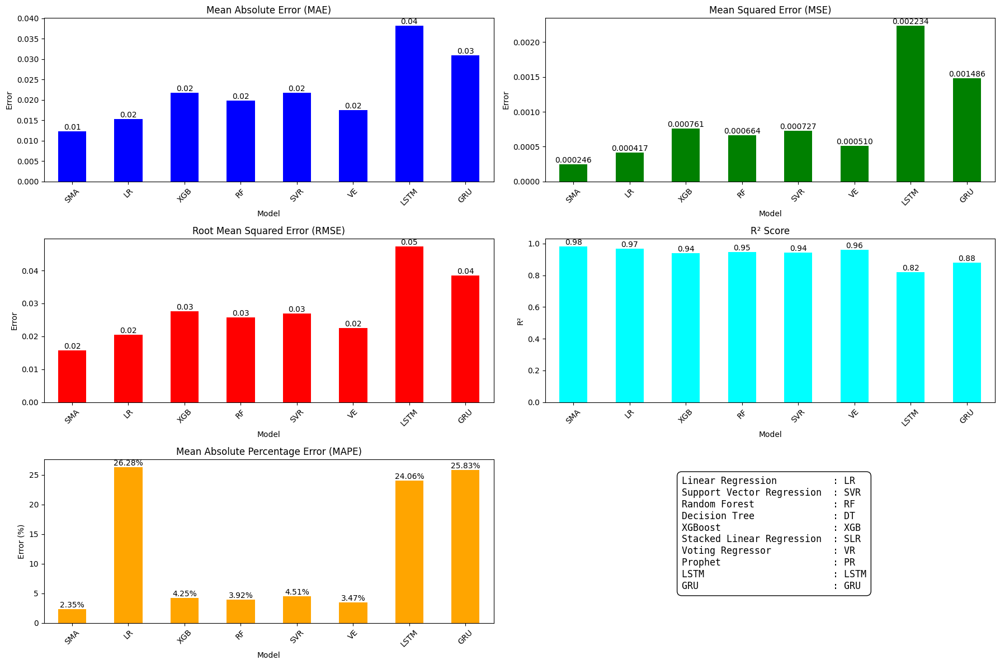

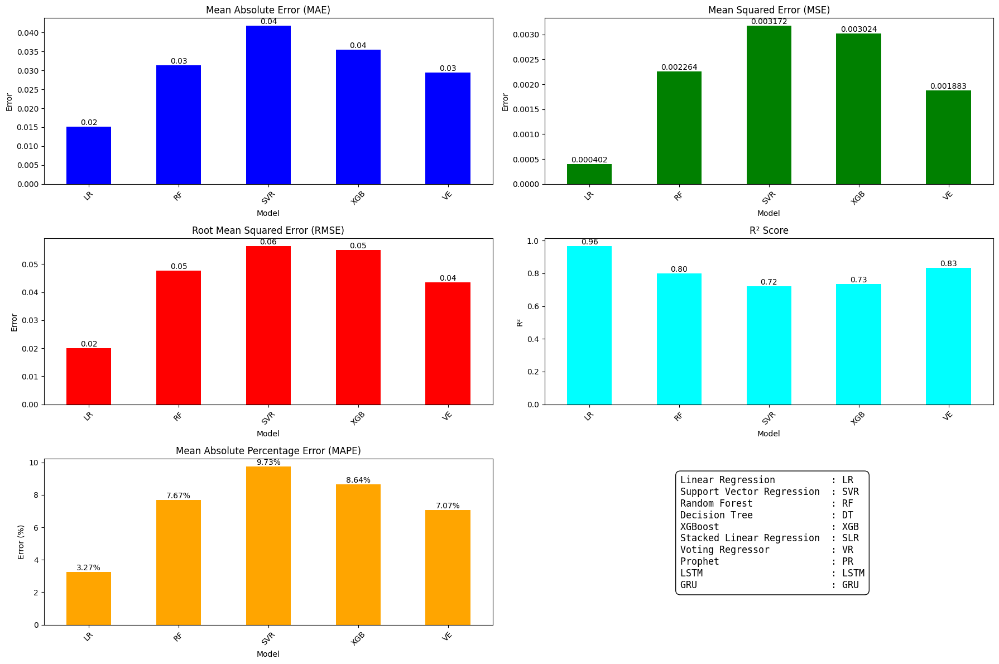

In [78]:
plot_model_comparsion(results_normal_training)
plot_model_comparsion(results_walk_forward_training)